Welcome to the StyleAIzed Detection project! This notebook documents the journey to create a model that can differentiate between human-made and AI-generated artwork. Here's a glimpse of the accomplishments and abilities of this notebook:

*   Trained on a dataset consisting of over 180,000+ works of art using both traditional and diffusion methods
*   Implemented model interpretability using XRAI attributions for better understanding of predictions
*   Detailed explanations from data preprocessing to model training and evaluation

Note that this is not the final version and I am still revising the resolution of the XRAI attributions at the end as it is blurry. And this project is a work in progress as I continue to collect more AI works I encounter on the web to enhance accuracy!

# Install Dependencies
First we'll install all the necessary libraries and dependencies required for this project. Here we'll be using both Torch and TensorFlow for its Keras Tuner as well as the Saliency package to make the attributions.

In [ ]:
!pip install torch torchvision keras_tuner tf tf-nightly saliency keras-tuner

# Download and Extract AI-ArtBench
We then download the AI-ArtBench dataset from Kaggle and extract its contents. This dataset will be crucial for training and evaluating our models.

In [ ]:
import os
from urllib.request import urlopen
from zipfile import ZipFile
from io import BytesIO

def download_and_unzip(url, extract_to='.'):
    # Define the expected directory path based on the extraction target
    directory_path = os.path.join(extract_to, '/Real_AI_SD_LD_Dataset')

    # Check if the directory already exists
    if not os.path.exists(directory_path):
        # Directory does not exist, download and extract the file
        http_response = urlopen(url)
        zipfile = ZipFile(BytesIO(http_response.read()))
        zipfile.extractall(path=extract_to)
        print('Done')
    else:
        # Directory exists, no need to download and extract
        print('Directory already exists:', directory_path)

# Example usage
download_and_unzip('https://www.kaggle.com/api/v1/datasets/download/ravidussilva/real-ai-art', '.')


Done


# Define Test and Training Data
We split up the datasets into training and testing images for both human-made and AI images. Each image has a streamlined particular suffix and prefix for easier parsing and sorting into the folders.

In [ ]:
import os

top_dir = './Real_AI_SD_LD_Dataset'
train_dir = os.path.join(top_dir, 'train')
test_dir = os.path.join(top_dir, 'test')
all_train_dir  = os.listdir(train_dir)
all_test_dir  = os.listdir(test_dir)

train_human = []
train_ai = []
test_human = []
test_ai = []

for dir in all_train_dir:
  if not dir.startswith('AI_'):
    train_human.append(os.path.join(train_dir, dir))
  else:
    train_ai.append(os.path.join(train_dir, dir))

print("Training directories containing human-drawn art:")
for i, dir in enumerate(train_human):
  print(f"{i}: {dir}")

print("\nTraining directories containing AI-drawn art:")
for i, dir in enumerate(train_ai):
  print(f"{i}: {dir}")

for dir in all_test_dir:
  if not dir.startswith('AI_'):
    test_human.append(os.path.join(test_dir, dir))
  else:
    test_ai.append(os.path.join(test_dir, dir))

print("\nTesting directories containing human-drawn art:")
for i, dir in enumerate(test_human):
  print(f"{i}: {dir}")

print("\nTesting directories containing AI-drawn art:")
for i, dir in enumerate(test_ai):
  print(f"{i}: {dir}")


# Plot Images in Dataset
Let's take a visual tour of our dataset by randomly selecting and displaying 9 sample images from our dataset, both from the human-made and AI sections.

Showing 9 human-made images in training...


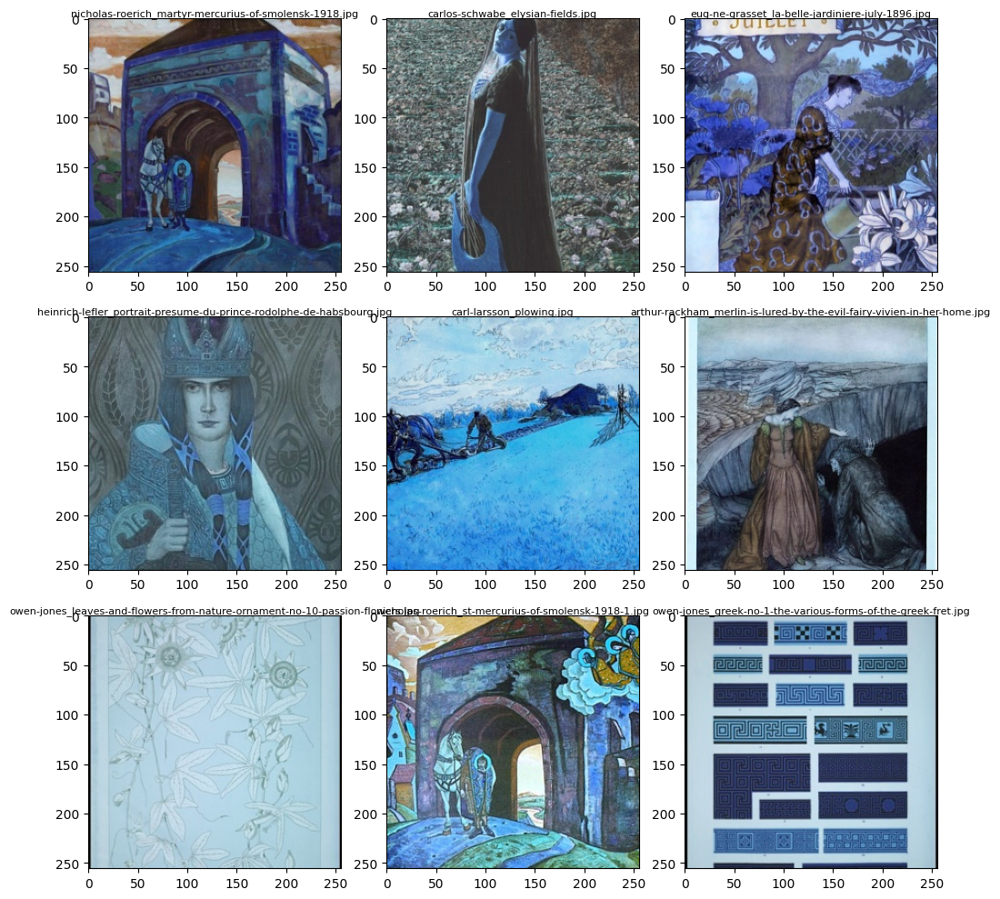

Showing 9 AI-generated images in training...


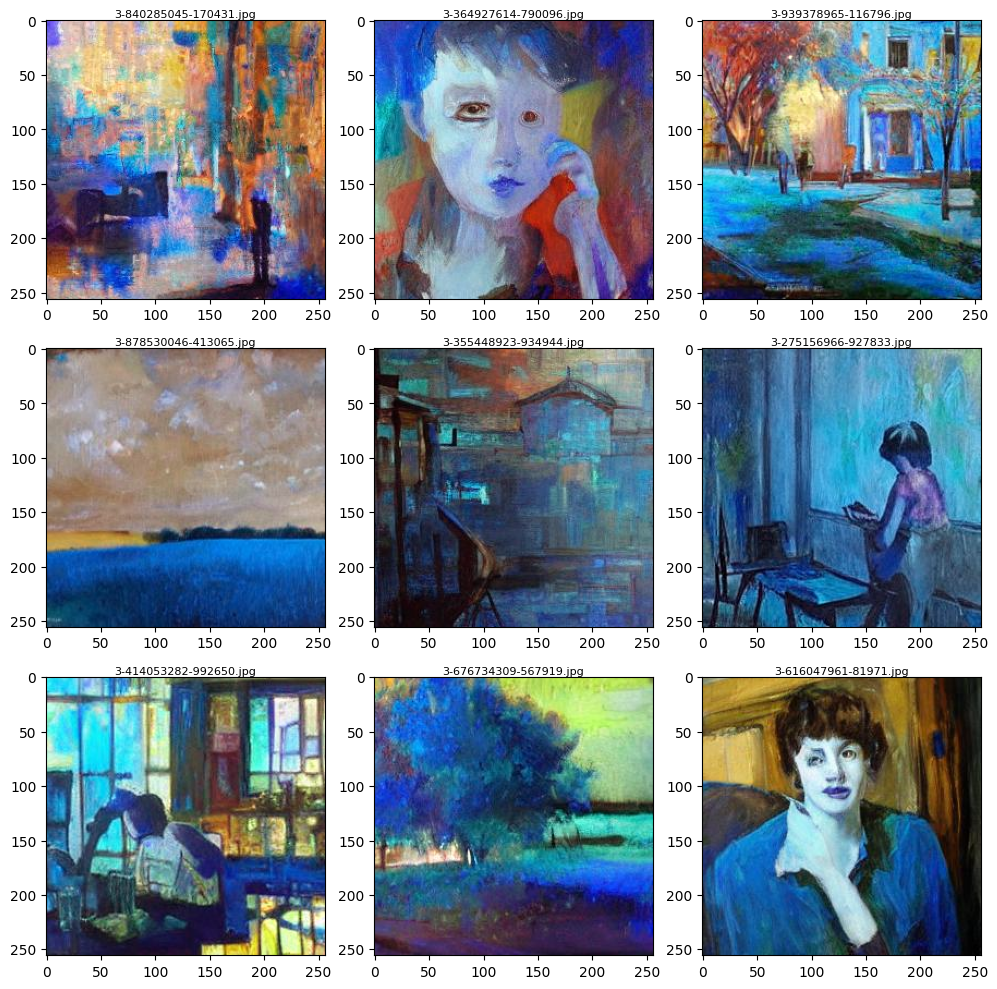

In [ ]:
import random
import cv2
from matplotlib import pyplot as plt
import numpy as np

def plot_images(directory, k = 9):
  files = os.listdir(directory)
  im = random.choices(files, k=k)
  fig = plt.figure(figsize=(10, 10))

  for i in range(k):
    im_i_path = os.path.join(directory, im[i])
    im_i = cv2.imread(im_i_path)
    axis = fig.add_subplot(int(np.sqrt(k)), int(np.sqrt(k)), i + 1)
    axis.imshow(im_i)
    axis.axis('on')
    axis.set_title(im[i], fontsize=8, pad=2)

  plt.tight_layout()
  plt.show()

# Sample 9 random human-made images
print("Showing 9 human-made images in training...")
r = random.randint(0, len(train_human) - 1)
real_images = plot_images(directory=train_human[r], k = 9)
plt.show()

# Sample 9 AI-generated images
print("Showing 9 AI-generated images in training...")
r = random.randint(0, len(train_ai) - 1)
real_images = plot_images(directory=train_ai[r], k = 9)
plt.show()

# Labelling Dataset
This section involves labeling the dataset images as either for training or testing.

## Training

In [ ]:
import pandas as pd

file_paths, labels = [], []
train_dataframe = pd.DataFrame(columns=['file_path', 'label'])

for dir in train_human:
  for file in os.listdir(dir):
    filepath = os.path.join(dir, file)
    file_paths.append(filepath)
    labels.append('human')

for dir in train_ai:
  for file in os.listdir(dir):
    filepath = os.path.join(dir, file)
    file_paths.append(filepath)
    labels.append('AI')

data = pd.DataFrame({'file_path': file_paths, 'label': labels})
train_dataframe = pd.concat([train_dataframe, data], ignore_index=True)
file_cts = train_dataframe['label'].value_counts()
print(f"\nNumber of files per label:\n\n{file_cts}")


Number of files per label:

label
AI       105015
human     50000
Name: count, dtype: int64


## Reduce and Balance Training Data
To avoid any biases, we will reduce and balance the training data. This step ensures that our model gets a fair representation of all classes during training.

In [ ]:
random_seed = 129
np.random.seed(random_seed)
amt_drop = 55015
ai_indices = train_dataframe[train_dataframe['label'] == 'AI'].index
indices_to_drop = np.random.choice(ai_indices, amt_drop, replace=False)
train_dataframe = train_dataframe.drop(indices_to_drop)
train_dataframe.reset_index(drop=True, inplace=True)
file_cts = train_dataframe['label'].value_counts()
print(f"\nNumber of files per training label:\n\n{file_cts}")


Number of files per training label:

label
human    50000
AI       50000
Name: count, dtype: int64


## Testing

In [ ]:
file_paths, labels = [], []
test_dataframe = pd.DataFrame(columns=['file_path', 'label'])

for dir in test_human:
  for file in os.listdir(dir):
    filepath = os.path.join(dir, file)
    file_paths.append(filepath)
    labels.append('human')

for dir in test_ai:
  for file in os.listdir(dir):
    filepath = os.path.join(dir, file)
    file_paths.append(filepath)
    labels.append('AI')

data = pd.DataFrame({'file_path': file_paths, 'label': labels})
test_dataframe = pd.concat([test_dataframe, data], ignore_index=True)
file_cts = test_dataframe['label'].value_counts()
print(f"\nNumber of files per testing label:\n\n{file_cts}")


Number of files per testing label:

label
AI       20000
human    10000
Name: count, dtype: int64


# Putting Together Training Data Set

In [ ]:
from keras.src.legacy.preprocessing.image import ImageDataGenerator
from keras.utils import image_dataset_from_directory
from keras.models import Sequential
from keras.layers import Rescaling, Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Activation, Dropout, GlobalAveragePooling2D
from keras.metrics import Precision, Recall
import keras_tuner as kt
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping

train_gen = ImageDataGenerator(rescale=1./255,
                              rotation_range=7,
                              horizontal_flip=True,
                              zoom_range=0.2
                              )
train_dataset = train_gen.flow_from_dataframe(dataframe=train_dataframe, x_col='file_path', y_col='label', target_size=(32, 32), class_mode='categorical', batch_size=64, shuffle=True)
train_dataset.class_indices

Found 100000 validated image filenames belonging to 2 classes.


{'AI': 0, 'human': 1}

# Putting Together Test Data Set

In [ ]:
test_gen = ImageDataGenerator(rescale=1./255)
test_dataset = test_gen.flow_from_dataframe(dataframe=test_dataframe, x_col='file_path', y_col='label', target_size=(32, 32), class_mode='categorical', batch_size=1, shuffle=False)
test_dataset.class_indices

Found 30000 validated image filenames belonging to 2 classes.


{'AI': 0, 'human': 1}

# Train CNN Model
  In this section, we train a Convolutional Neural Network (CNN) model using our prepared dataset. First the mages are resized, normalized, and augmented (with techniques like rotation and flipping) to create a diverse training set. Then we assemble the layers of the CNN which consists of:


*   Convolutional layers to detect features such as edges and textures
*   ReLu layers to introduce non-linearity
*   Pooling layers to reduce spatial dimensions and computational load
*   Fully connected layers to combine features for classification
*   Dropout layers to prevent overfitting by randomly setting input units to zero
   
   
The model is then compiled with an Adam optimizer, a categorical cross-entropy loss function, forward and backward propagation, periodical validation, and performance metrics to measure accuracy amongst other traits.

## Build Model

In [ ]:
import tensorflow as tf
from keras import layers, models
from keras.optimizers import Adam
from keras.optimizers.schedules import ExponentialDecay
from keras.callbacks import EarlyStopping

network = Sequential()
network.add(Conv2D(filters = 64, kernel_size = 3, input_shape = (32,32,3), activation='relu'))
network.add(MaxPooling2D())
network.add(Conv2D(filters = 64, kernel_size = 3, activation='relu'))
network.add(MaxPooling2D())
network.add(Flatten())
network.add(Dense(units = 64, activation='relu'))
network.add(Dropout(0.2))
network.add(Dense(units = 2, activation='softmax'))

# optimizers
e_schedule = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, mode='max', verbose=1, start_from_epoch=1)
lr_schedule = ExponentialDecay(initial_learning_rate=0.001, decay_steps=14067, decay_rate=0.99)
custom_adam_op = Adam(learning_rate=lr_schedule, clipnorm=1.0)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


## Save and Train the Model

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

eschedule = EarlyStopping(monitor='val_accuracy', patience=12, restore_best_weights=True, mode='max', verbose=1, start_from_epoch=1)
model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_accuracy', save_best_only=True, mode='max', verbose=1)
network.compile(optimizer=custom_adam_op,
              loss='categorical_crossentropy',
              metrics=['accuracy', 'Precision', 'Recall'])
network.summary()
history = network.fit(train_dataset, epochs=30, validation_data=test_dataset, callbacks=[model_checkpoint, e_schedule])

# Evaluate Validation Accuracy

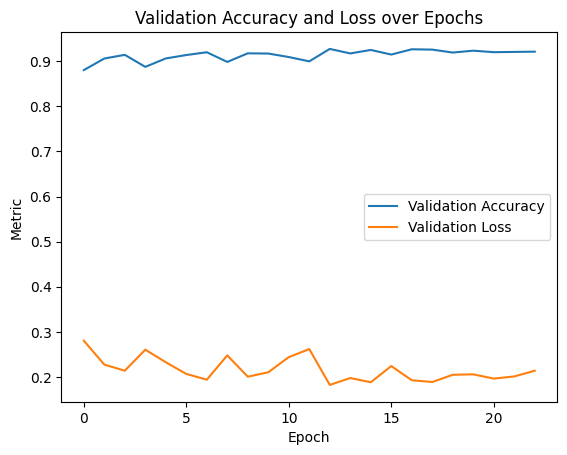

In [ ]:
# Plot validation accuracy
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')

# Plot validation loss
plt.plot(history.history['val_loss'], label='Validation Loss')

# Adding labels and title
plt.xlabel('Epoch')
plt.ylabel('Metric')
plt.title('Validation Accuracy and Loss over Epochs')

# Adding legend
plt.legend()

# Show plot
plt.show()

# Predict Test Data Set

## Make Predictions

In [ ]:
predictions = network.predict(test_dataset)
predictions = np.argmax(predictions, axis=1)

30000/30000 ━━━━━━━━━━━━━━━━━━━━ 86s 3ms/step


## Observe Precision and Accuracy

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(test_dataset.classes, predictions))

              precision    recall  f1-score   support

           0       0.94      0.95      0.95     20000
           1       0.90      0.88      0.89     10000

    accuracy                           0.93     30000
   macro avg       0.92      0.92      0.92     30000
weighted avg       0.93      0.93      0.93     30000



## Setup Confusion Matrix
We'll set up and analyze this matrix to gain deeper insights into the model's predictions. For this run it misclassified a little over a thousand images from human and AI, which means there's much work in progress to improve its accuracy classifying!


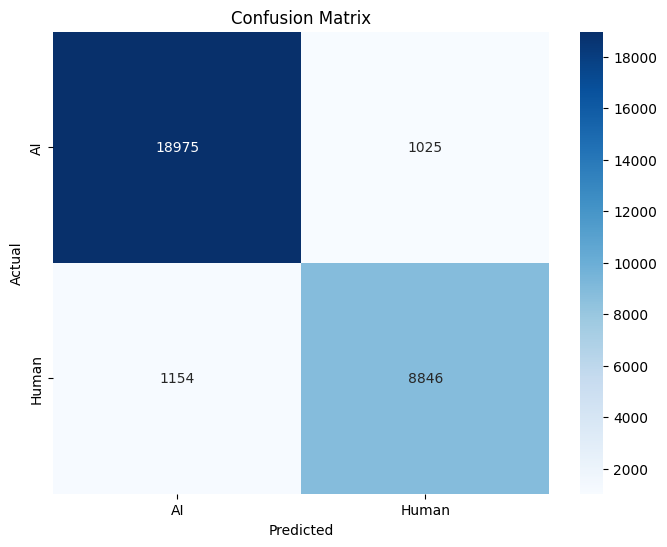

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Get the confusion matrix
cm = confusion_matrix(test_dataset.classes, predictions)

labels = ['AI', 'Human']
cm_df = pd.DataFrame(cm, index=labels, columns=labels)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

## Predict on Unseen Samples
Testing our model's generalization capability, we will make predictions on new, unseen samples. This step is vital to see how well the model can adapt to novel data. In this case you can replace the `input_path` with the folder to your test images in Google Drive for your perusal.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


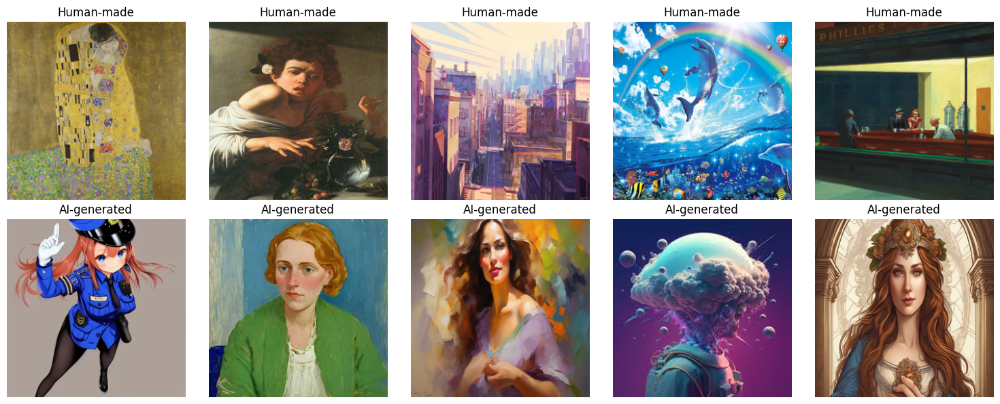

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

model = keras.models.load_model('best_model.keras')
input_path = '/content/drive/MyDrive/AA-Test-Inputs/'
files = os.listdir(input_path)
image_files = sorted([file for file in files if file.endswith(('.jpg', '.png'))])

def predict_and_visualize(img_path, ax, target_size=(32, 32), display_size=(256, 256)):
    if ax is None:
      fig, ax = plt.subplots()
    # Load the original image for display
    display_img = Image.open(img_path)
    display_img = display_img.resize(display_size)

    # Load and preprocess the image for prediction
    prediction_img = Image.open(img_path)
    prediction_img = prediction_img.resize(target_size, Image.LANCZOS)
    prediction_img = np.asarray(prediction_img)
    prediction_img = prediction_img / 255.0  # Normalize the image
    prediction_img = np.expand_dims(prediction_img, axis=0)  # Add the batch dimension

    # Make the prediction
    prediction = model.predict(prediction_img)
    predicted_class = np.argmax(prediction, axis=1)  # Get the class with the highest probability
    class_labels = {0: "AI-generated", 1: "Human-made"}
    pred_label = class_labels[predicted_class[0]]

    # Display the larger image
    ax.imshow(np.array(display_img))  # Display with bicubic interpolation
    ax.set_title(pred_label)
    ax.axis('off')

# Set up the plot grid
ROWS = 2
COLS = 5
fig, axes = plt.subplots(ROWS, COLS, figsize=(COLS * 3, ROWS * 3))  # Increase figsize to improve display size
axes_flat = axes.flatten()

# Loop over the sorted image files
for i, image_file in enumerate(image_files):
    img_path = os.path.join(input_path, image_file)  # Get the full image path
    predict_and_visualize(img_path, axes_flat[i], target_size=(32, 32), display_size=(256, 256))  # Call function

plt.tight_layout()
plt.show()

# https://stable-diffusion-art.com/sdxl-styles/

# Explainable Attributions using XRAI
Moving towards interpretability, this section explores explainable AI techniques using XRAI (eXtended Region-based Attributions Integrated). XRAI is a method for generating saliency maps that highlight the most important regions of an image that influence the model's predictions.


Unlike other saliency methods that may focus on pixel-level attributions, XRAI integrates region-based attributions to provide more coherent and interpretable visual explanations. It works by initially generating a fine-grained saliency map and then grouping adjacent pixels into superpixels. These superpixels are iteratively merged based on their importance until the most relevant regions are identified, whcih then allows for a more human-interpretable understanding of which parts of an image are most significant for the model's decision.


For more detailed information, you can read the [XRAI paper here.](https://arxiv.org/abs/1906.02825)

## Import Necessary Dependencies

In [ ]:
import tensorflow as tf
import PIL.Image
from matplotlib import pylab as P
from tensorflow import keras
import saliency.tf1 as saliency
import warnings
from PIL import Image
import json
import tensorflow.python.keras.backend as K
%matplotlib inline
warnings.filterwarnings("ignore")

## Utility Functions
We'll define some utility functions that assist in generating and visualizing XRAI attributions. These functions simplify repetitive tasks and enhance our workflow, such as working with our images and labelling them.

In [ ]:
def ShowImage(img, title='', ax=None):
    if ax is None:
        fig, ax = plt.subplots()
    P.axis('off')
    # Remove the batch dimension by selecting the first image in the batch
    img = img[0]
    img = (img * 255).astype(np.uint8)
    P.imshow(img, interpolation='lanczos')
    P.title(title)
    P.show()

def LoadImg(img_path, target_size = (32, 32)):
  img = PIL.Image.open(img_path)
  img = img.resize(target_size)
  img = np.asarray(img, dtype=np.float32)
  img = np.expand_dims(img, axis=0)  # Add the batch dimension
  return img/255.0

# For processing file uploads by user
def LoadImgStream(file_stream, target_size=(32, 32)):
    img = Image.open(file_stream)
    img = img.resize(target_size)
    img = np.asarray(img, dtype=np.float32) / 255.0  # Normalize
    img = np.expand_dims(img, axis=0)  # Add the batch dimension
    return img/255.0

def LoadAndUpsampleImg(img_path, target_size=(256, 256)):
    img = Image.open(img_path)
    img = img.resize(target_size, Image.LANCZOS)  # Upsample for display
    img = np.asarray(img, dtype=np.float32) / 255.0  # Normalize
    return img

def GetLabel(model, img_path):
    img = LoadImg(img_path)
    prediction = model.predict(img)
    predicted_class = np.argmax(prediction, axis=1)  # Get the class with the highest probability
    class_labels = {0: "AI-generated", 1: "Human-made"}
    pred_label = class_labels[predicted_class[0]]
    return pred_label

## Define Call Model Function for Inference
This function computes the gradients for saliency maps using TensorFlow's GradientTape. It handles two scenarios: computing input-output gradients, reflecting how changes in the input affect model predictions, and obtaining convolution-output gradients for interpreting intermediary layers. While wrapping gradients as NumPy arrays is non-standard, this is done for compatibility with external saliency libraries. This function is slightly tailored to work with the custom Sequential CNN model, providing both predictions and intermediate layer activations as opposed to only the final output.

In [ ]:
import saliency.core as saliency

model = tf.keras.models.load_model('best_model.keras')

def call_model_function(images, call_model_args=None, expected_keys=None):
  target_class_idx = call_model_args[0]
  images = tf.convert_to_tensor(images)
  with tf.GradientTape() as tape:
    if expected_keys==[saliency.base.INPUT_OUTPUT_GRADIENTS]:
      tape.watch(images)
      output_layer = model(images)
      output_layer = output_layer[:, target_class_idx]
      gradients = np.array(tape.gradient(output_layer, images))
      return {saliency.base.INPUT_OUTPUT_GRADIENTS: gradients}
    else:
      conv_layer, output_layer = model(images)
      gradients = np.array(tape.gradient(output_layer, conv_layer))
      return {saliency.base.CONVOLUTION_LAYER_VALUES: conv_layer,
              saliency.base.INPUT_OUTPUT_GRADIENTS: gradients}


## Define Fast and Full XRAI Attributions

In [ ]:
from scipy.ndimage import zoom

def load_xrai(model, img_path):
  # Load image and infer
  test_img = LoadImg(img_path)
  xrai_object = saliency.XRAI()
  test_img = test_img.squeeze()
  call_model_args = {0: 0, 1: 1}
  xrai_attributions = xrai_object.GetMask(test_img, call_model_function, call_model_args)

  # Load the original high-resolution image for display
  original_high_res_img = LoadAndUpsampleImg(img_path)
  upscale_factor = 256 / 32
  xrai_attributions_upsampled = zoom(xrai_attributions, (upscale_factor, upscale_factor), order=1)

  # Create a high-resolution mask for the top 25%
  mask_upsampled = xrai_attributions_upsampled >= np.percentile(xrai_attributions_upsampled, 75)
  im_mask_high_res = original_high_res_img.copy()
  im_mask_high_res[~mask_upsampled] = 0  # Apply mask to high-resolution image

  # Plotting
  fig, axes = plt.subplots(1, 3, figsize=(15, 5))

  # Original Image
  axes[0].imshow(original_high_res_img)
  axes[0].set_title(f"{GetLabel(model, img_path)}")
  axes[0].axis('off')  # Hide axes

  # XRAI Heatmap upsampled
  axes[1].imshow(xrai_attributions_upsampled, cmap='magma')
  axes[1].set_title('XRAI Heatmap')
  axes[1].axis('off')

  # Top 30% mask applied to high-resolution image
  axes[2].imshow(im_mask_high_res)
  axes[2].set_title('Top 25%')
  axes[2].axis('off')

  plt.tight_layout()
  plt.show()

## Apply XRAI Attributions to Unseen Images
Finally, we demonstrate the application of XRAI attributions to new, unseen images. This step allows us to interpret the model's behavior on novel data and ensure its decisions are not only accurate but justifiable.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


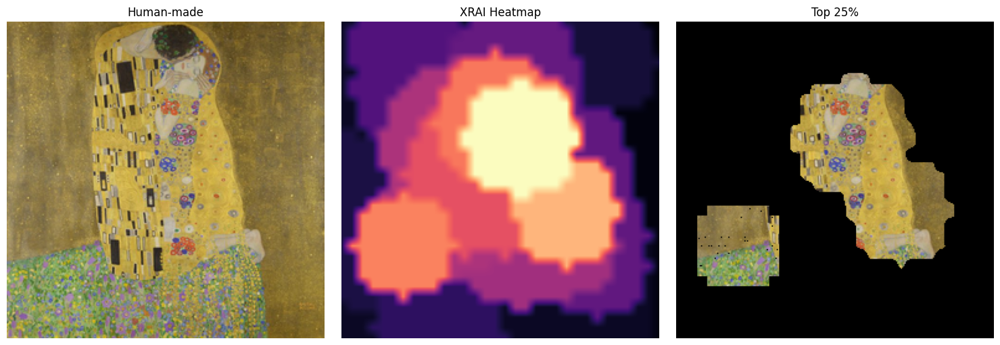

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


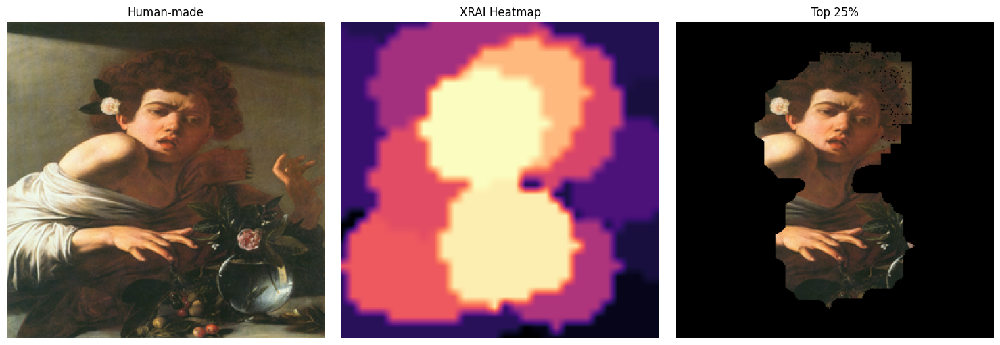

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


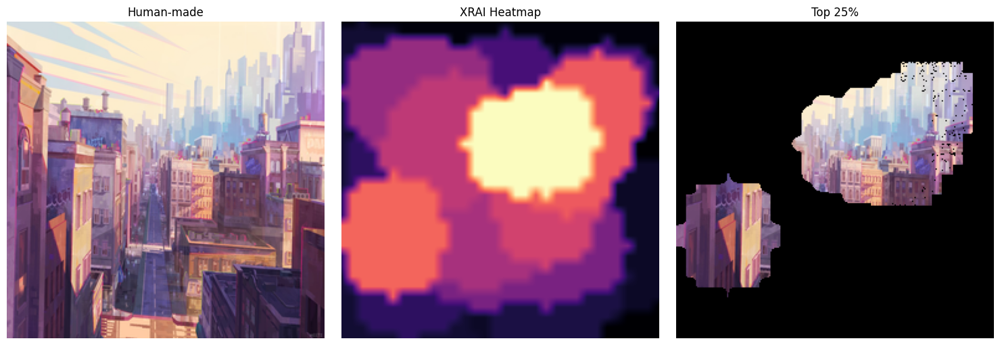

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


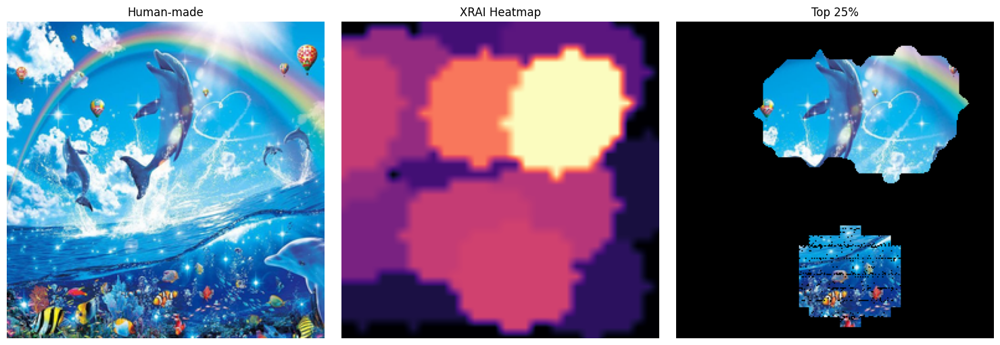

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


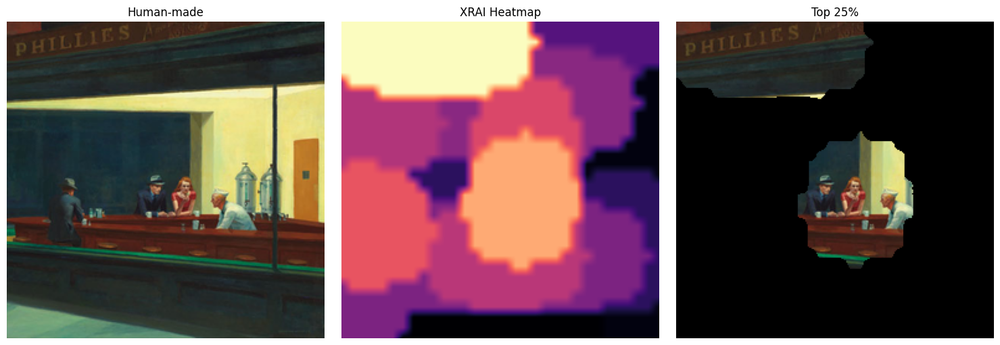

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


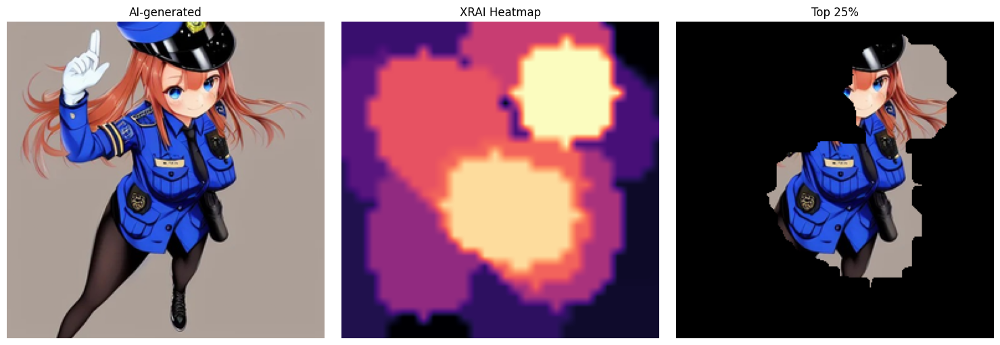

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


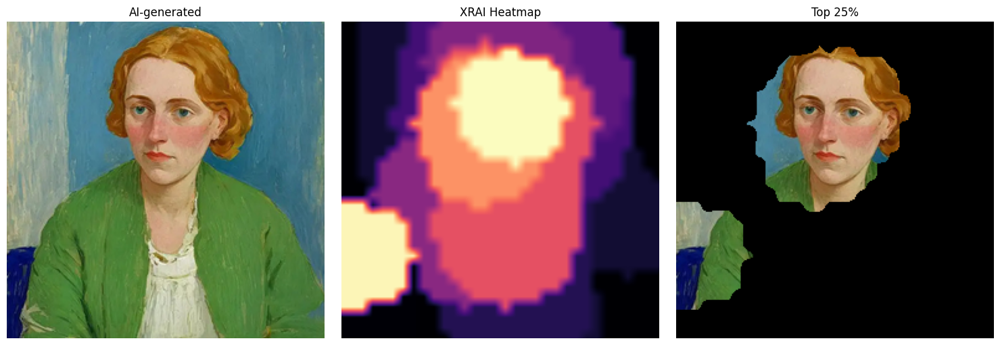

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


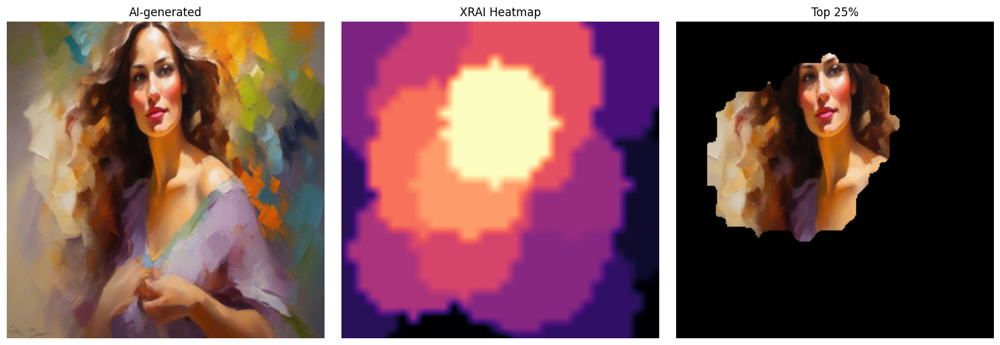

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


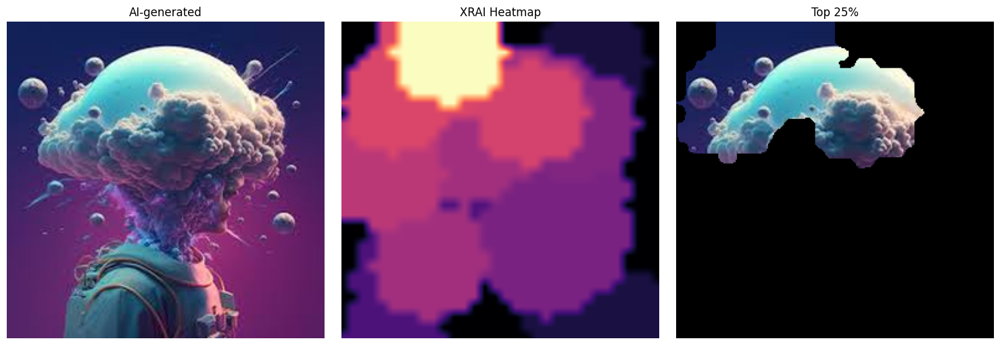

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


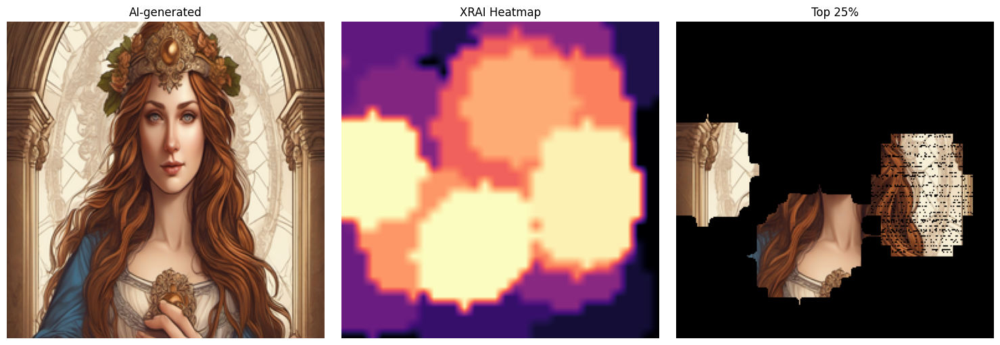

In [ ]:
input_path = '/content/drive/MyDrive/AA-Test-Inputs/'
files = os.listdir(input_path)
image_files = sorted([file for file in files if file.endswith(('.jpg', '.png'))])

# Loop over the sorted image files
for i, image_file in enumerate(image_files):
    img_path = os.path.join(input_path, image_file)  # Get the full image path
    load_xrai(model, img_path)